# **Supermarket Dataset**
## Project Goal:
The goal of this project is to analyze sports product sales data to gain insights into profitability, pricing, and sales performance. Specifically, the project will answer questions such as:


1.   How are sales distributed by region and sales method?
2.   What are the trends in sales and profits over time?
3.   How do product prices impact sales and profitability?

These insights will support data-driven decisions to optimize sales and pricing strategies.

In [5]:
!pip install ydata_profiling

In [4]:
!pip install squarify

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import missingno as msno
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
import squarify

In [7]:
df = pd.read_excel('SuperMarket.xlsx')
df

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750678428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08:00,Ewallet,522.83,4.761905,26.1415,9.1
1,226313081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29:00,Cash,76.40,4.761905,3.8200,9.6
2,631413108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23:00,Credit card,324.31,4.761905,16.2155,7.4
3,123191176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33:00,Ewallet,465.76,4.761905,23.2880,8.4
4,373737910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37:00,Ewallet,604.17,4.761905,30.2085,5.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233675758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,2019-01-29,13:46:00,Ewallet,40.35,4.761905,2.0175,6.2
996,303962227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,2019-03-02,17:16:00,Ewallet,973.80,4.761905,48.6900,4.4
997,727021313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,2019-02-09,13:22:00,Cash,31.84,4.761905,1.5920,7.7
998,347562442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,2019-02-22,15:33:00,Cash,65.82,4.761905,3.2910,4.1


## **Data Exploration & Column Summary**

In [8]:
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750678428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08:00,Ewallet,522.83,4.761905,26.1415,9.1
1,226313081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29:00,Cash,76.40,4.761905,3.8200,9.6
2,631413108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23:00,Credit card,324.31,4.761905,16.2155,7.4
3,123191176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33:00,Ewallet,465.76,4.761905,23.2880,8.4
4,373737910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37:00,Ewallet,604.17,4.761905,30.2085,5.3


In [9]:
df.tail()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
995,233675758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,2019-01-29,13:46:00,Ewallet,40.35,4.761905,2.0175,6.2
996,303962227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,2019-03-02,17:16:00,Ewallet,973.80,4.761905,48.6900,4.4
997,727021313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,2019-02-09,13:22:00,Cash,31.84,4.761905,1.5920,7.7
998,347562442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,2019-02-22,15:33:00,Cash,65.82,4.761905,3.2910,4.1
999,849093807,A,Yangon,Member,Female,Fashion accessories,88.34,7,30.9190,649.2990,2019-02-18,13:28:00,Cash,618.38,4.761905,30.9190,6.6


In [10]:
df.columns.to_list()

['Invoice ID',
 'Branch',
 'City',
 'Customer type',
 'Gender',
 'Product line',
 'Unit price',
 'Quantity',
 'Tax 5%',
 'Total',
 'Date',
 'Time',
 'Payment',
 'cogs',
 'gross margin percentage',
 'gross income',
 'Rating']

In [11]:
df.shape

(1000, 17)

**Data Cleaning**

In [12]:
from ydata_profiling import ProfileReport
ProfileReport
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 17/17 [00:00<00:00, 65.50it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## **Data Cleaning and Transformation**

In [13]:
df.isnull().sum()

,0
Invoice ID,0
Branch,0
City,0
Customer type,0
Gender,0
Product line,0
Unit price,0
Quantity,0
Tax 5%,0
Total,0


In [14]:
df.duplicated().sum()

np.int64(0)

In [15]:
df['Date'] = pd.to_datetime(df['Date'])
df['Month'] = df['Date'].dt.month
df['Day'] = df['Date'].dt.day
df

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating,Month,Day
0,750678428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,2019-01-05,13:08:00,Ewallet,522.83,4.761905,26.1415,9.1,1,5
1,226313081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,2019-03-08,10:29:00,Cash,76.40,4.761905,3.8200,9.6,3,8
2,631413108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,2019-03-03,13:23:00,Credit card,324.31,4.761905,16.2155,7.4,3,3
3,123191176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,2019-01-27,20:33:00,Ewallet,465.76,4.761905,23.2880,8.4,1,27
4,373737910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2019-02-08,10:37:00,Ewallet,604.17,4.761905,30.2085,5.3,2,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,233675758,C,Naypyitaw,Normal,Male,Health and beauty,40.35,1,2.0175,42.3675,2019-01-29,13:46:00,Ewallet,40.35,4.761905,2.0175,6.2,1,29
996,303962227,B,Mandalay,Normal,Female,Home and lifestyle,97.38,10,48.6900,1022.4900,2019-03-02,17:16:00,Ewallet,973.80,4.761905,48.6900,4.4,3,2
997,727021313,A,Yangon,Member,Male,Food and beverages,31.84,1,1.5920,33.4320,2019-02-09,13:22:00,Cash,31.84,4.761905,1.5920,7.7,2,9
998,347562442,A,Yangon,Normal,Male,Home and lifestyle,65.82,1,3.2910,69.1110,2019-02-22,15:33:00,Cash,65.82,4.761905,3.2910,4.1,2,22


## **Data Overview and Descriptive Statistics**

In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Invoice ID               1000 non-null   int64         
 1   Branch                   1000 non-null   object        
 2   City                     1000 non-null   object        
 3   Customer type            1000 non-null   object        
 4   Gender                   1000 non-null   object        
 5   Product line             1000 non-null   object        
 6   Unit price               1000 non-null   float64       
 7   Quantity                 1000 non-null   int64         
 8   Tax 5%                   1000 non-null   float64       
 9   Total                    1000 non-null   float64       
 10  Date                     1000 non-null   datetime64[ns]
 11  Time                     1000 non-null   object        
 12  Payment                  1000 non-n

In [17]:
df.describe()

,Invoice ID,Unit price,Quantity,Tax 5%,Total,Date,cogs,gross margin percentage,gross income,Rating,Month,Day
count,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000,1000.00000,1.000000e+03,1000.000000,1000.00000,1000.000000,1000.000000
mean,5.053204e+08,55.672130,5.510000,15.379369,322.966749,2019-02-14 00:05:45.600000,307.58738,4.761905e+00,15.379369,6.97270,1.993000,15.256000
min,1.011762e+08,10.080000,1.000000,0.508500,10.678500,2019-01-01 00:00:00,10.17000,4.761905e+00,0.508500,4.00000,1.000000,1.000000
25%,3.035097e+08,32.875000,3.000000,5.924875,124.422375,2019-01-24 00:00:00,118.49750,4.761905e+00,5.924875,5.50000,1.000000,8.000000
50%,5.108734e+08,55.230000,5.000000,12.088000,253.848000,2019-02-13 00:00:00,241.76000,4.761905e+00,12.088000,7.00000,2.000000,15.000000
75%,7.127986e+08,77.935000,8.000000,22.445250,471.350250,2019-03-08 00:00:00,448.90500,4.761905e+00,22.445250,8.50000,3.000000,23.000000
max,8.980427e+08,99.960000,10.000000,49.650000,1042.650000,2019-03-30 00:00:00,993.00000,4.761905e+00,49.650000,10.00000,3.000000,31.000000
std,2.303100e+08,26.494628,2.923431,11.708825,245.885335,NaN,234.17651,6.131498e-14,11.708825,1.71858,0.835254,8.693563


## **Key Performance Indicators (KPIs)**

In [18]:
total_sales = df['Total'].sum()
total_profit = df['gross income'].sum()
sales_by_product_line = df.groupby('Product line')['Total'].sum()
sales_by_branch = df.groupby('Branch')['Total'].sum()
avg_order_value = df['Total'].mean()
print(f"Total Sales: ${total_sales:,.2f}")
print(f"Total Profit: ${total_profit:,.2f}")
print("\nSales by Product Line:")
print(sales_by_product_line)
print("\nSales by Branch:")
print(sales_by_branch)
print(f"\nAverage Order Value: ${avg_order_value:,.2f}")

Total Sales: $322,966.75
Total Profit: $15,379.37

Sales by Product Line:
Product line
Electronic accessories    54337.5315
Fashion accessories       54305.8950
Food and beverages        56144.8440
Health and beauty         49193.7390
Home and lifestyle        53861.9130
Sports and travel         55122.8265
Name: Total, dtype: float64

Sales by Branch:
Branch
A    106200.3705
B    106197.6720
C    110568.7065
Name: Total, dtype: float64

Average Order Value: $322.97


In [19]:
columns_to_average = [
    'Unit price',
    'Quantity',
    'Tax 5%',
    'Total',
    'cogs',
    'gross margin percentage',
    'gross income',
    'Rating'
]

average_values = df[columns_to_average].mean()
print("average values")
print(" ")
print(average_values)


average values
 
Unit price                  55.672130
Quantity                     5.510000
Tax 5%                      15.379369
Total                      322.966749
cogs                       307.587380
gross margin percentage      4.761905
gross income                15.379369
Rating                       6.972700
dtype: float64


## **Visualizations**

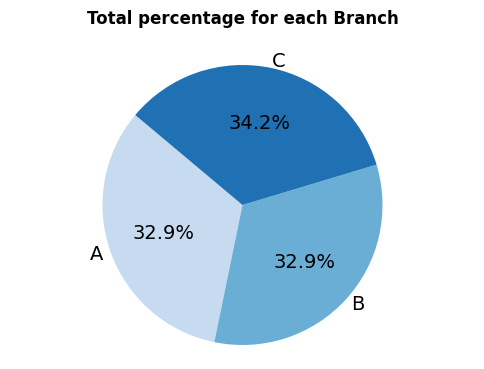

In [20]:
branch_totals = df.groupby('Branch')['Total'].sum()
plt.figure(figsize=(6, 4))
colors = sns.color_palette("Blues", n_colors=len(branch_totals))
plt.pie(branch_totals, labels=branch_totals.index, autopct='%1.1f%%', startangle=140, labeldistance=1.05, textprops={'fontsize': 14}, colors= colors)
plt.title('Total percentage for each Branch', fontsize=12, fontweight='bold', pad='20')
plt.axis('equal')
plt.show()


In [21]:
city_stats = df.groupby('City')['Total'].agg(['sum', 'mean', 'count'])
print(city_stats)

                   sum        mean  count
City                                     
Mandalay   106197.6720  319.872506    332
Naypyitaw  110568.7065  337.099715    328
Yangon     106200.3705  312.354031    340


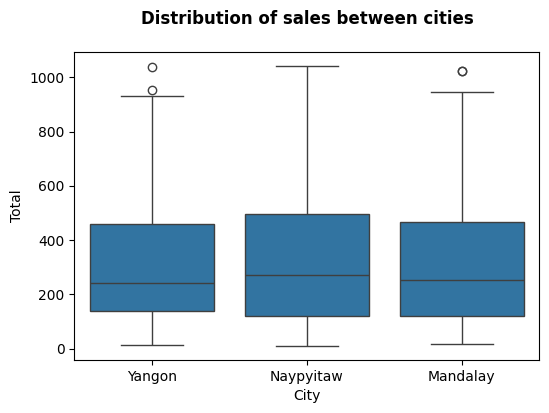

In [22]:
plt.figure(figsize=(6, 4))
sns.boxplot(x='City', y='Total', data=df)
plt.title('Distribution of sales between cities', fontsize= '12', fontweight= 'bold', pad='20')
plt.show()

In [23]:
product_performance = df.groupby('Product line')['Quantity'].sum().sort_values(ascending=False)
print(product_performance)

Product line
Electronic accessories    971
Food and beverages        952
Sports and travel         920
Home and lifestyle        911
Fashion accessories       902
Health and beauty         854
Name: Quantity, dtype: int64


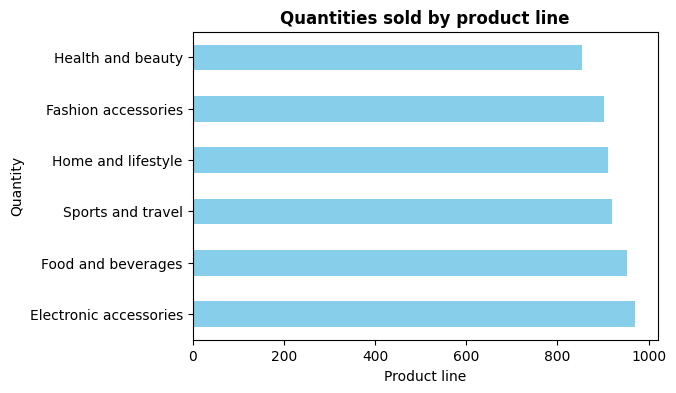

In [24]:
plt.figure(figsize=(6, 4))
product_performance.plot(kind='barh', color='skyblue')
plt.title('Quantities sold by product line', fontsize='12', fontweight='bold')
plt.ylabel('Quantity')
plt.xlabel('Product line')
plt.show()

In [25]:
profitability = df.groupby('Product line')['gross income'].sum().sort_values(ascending=False)
print(profitability)

Product line
Food and beverages        2673.5640
Sports and travel         2624.8965
Electronic accessories    2587.5015
Fashion accessories       2585.9950
Home and lifestyle        2564.8530
Health and beauty         2342.5590
Name: gross income, dtype: float64


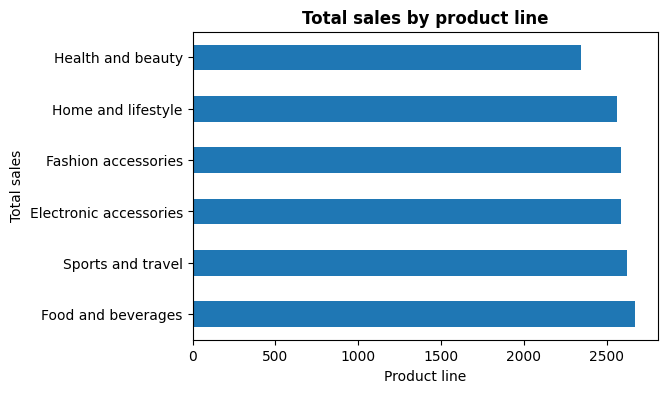

In [26]:
plt.figure(figsize=(6, 4))
profitability.plot(kind='barh')
plt.title('Total sales by product line', fontsize='12', fontweight='bold')
plt.xlabel('Product line')
plt.ylabel('Total sales')
plt.show()

In [27]:
customer_analysis = df.groupby('Customer type').agg({'Total': ['mean', 'sum'],'Invoice ID': 'count'})
print(customer_analysis)

                    Total             Invoice ID
                     mean         sum      count
Customer type                                   
Member         327.791305  164223.444        501
Normal         318.122856  158743.305        499


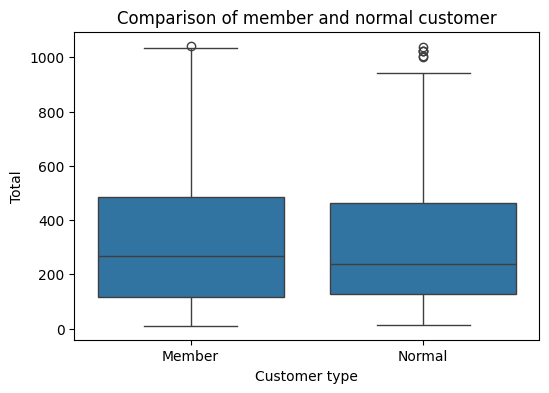

In [28]:
plt.figure(figsize=(6, 4))
sns.boxplot(x='Customer type', y='Total', data=df)
plt.title('Comparison of member and normal customer')
plt.show()

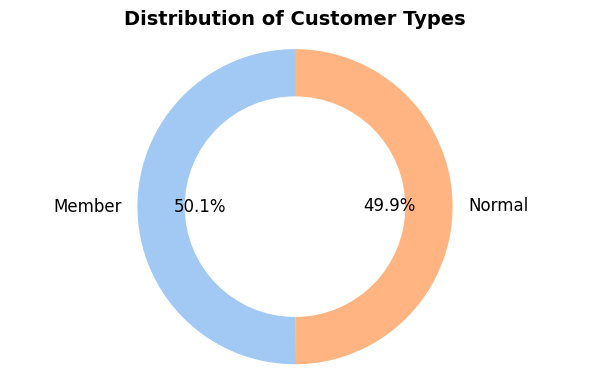

In [29]:
customer_counts = df['Customer type'].value_counts()
plt.figure(figsize=(6,4))
wedges, texts, autotexts = plt.pie(customer_counts, labels=customer_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('pastel'), textprops={'fontsize': 12})
centre_circle = plt.Circle((0,0), 0.70, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.title('Distribution of Customer Types', fontsize=14, fontweight='bold')
plt.axis('equal')
plt.tight_layout()
plt.show()


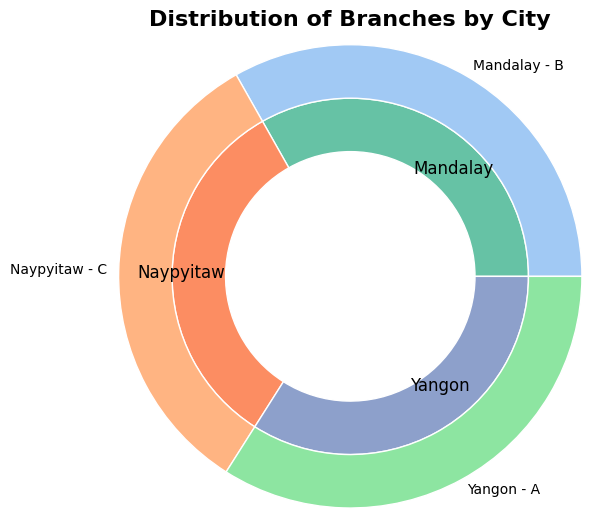

In [30]:
# Grouping data by City and Branch and calculating the count of records
city_branch_counts = df.groupby(['City', 'Branch']).size().reset_index(name='count')

# Inside level (City) details
city_totals = city_branch_counts.groupby('City')['count'].sum()
cities = city_totals.index
city_sizes = city_totals.values

# Outside level (Branch) details
branches = city_branch_counts['Branch']
branch_sizes = city_branch_counts['count']
branch_labels = city_branch_counts.apply(lambda row: f"{row['City']} - {row['Branch']}", axis=1)

# Plotting the donut chart
fig, ax = plt.subplots(figsize=(6, 6))

# Inside level (City)
inner_colors = sns.color_palette("Set2", len(cities))
ax.pie(city_sizes, radius=1, labels=cities, labeldistance=0.7, colors=inner_colors, wedgeprops=dict(width=0.3, edgecolor='w'), textprops={'fontsize': 12})

# Outside level (Branch)
outer_colors = sns.color_palette("pastel", len(branches))
ax.pie(branch_sizes, radius=1.3, labels=branch_labels, labeldistance=1.05, colors=outer_colors, wedgeprops=dict(width=0.3, edgecolor='w'), textprops={'fontsize': 10})
plt.title('Distribution of Branches by City', fontsize=16, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()


<ipython-input-31-8a7a79039082>:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_sales = df.groupby(pd.Grouper(key='Date', freq='M'))['Total'].sum()


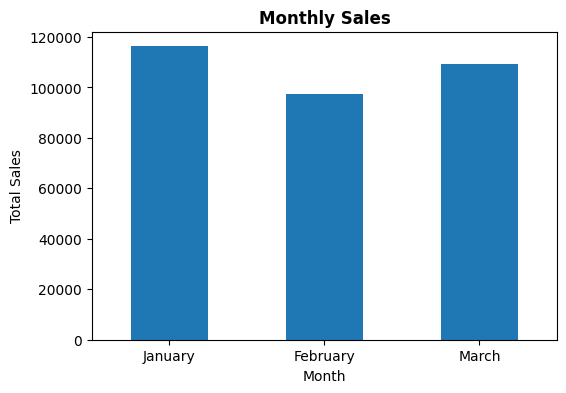

In [31]:
df['Date'] = pd.to_datetime(df['Date'])
monthly_sales = df.groupby(pd.Grouper(key='Date', freq='M'))['Total'].sum()
monthly_sales.index = monthly_sales.index.strftime('%B')
monthly_sales.plot(kind='bar', figsize=(6, 4))
plt.xticks(rotation=0)
plt.title('Monthly Sales', fontsize= '12', fontweight='bold')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.show()

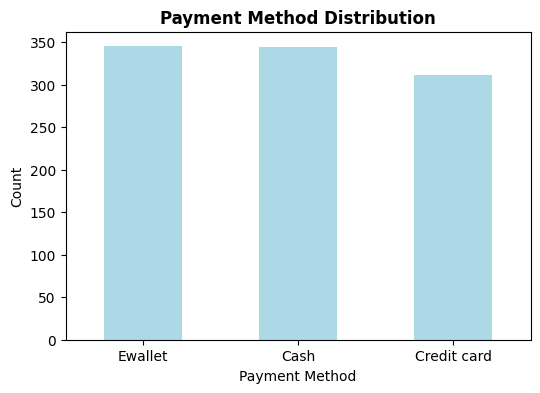

In [32]:
df['Payment'].value_counts().plot(kind='bar', figsize=(6, 4), color='lightblue')
plt.title('Payment Method Distribution', fontsize='12', fontweight='bold')
plt.xlabel('Payment Method')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.show()

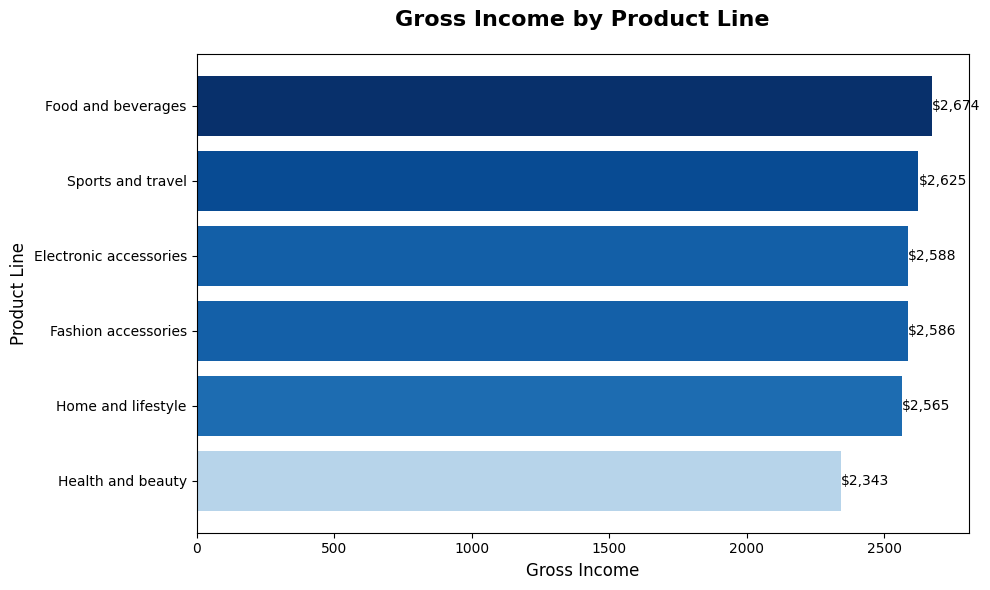

In [33]:
product_profit = df.groupby('Product line')['gross income'].sum().reset_index()
product_profit = product_profit.sort_values('gross income', ascending=False)

# Normalize and trim colormap
norm = plt.Normalize(product_profit['gross income'].min(), product_profit['gross income'].max())
base_cmap = plt.cm.Blues
trimmed_cmap = mcolors.LinearSegmentedColormap.from_list("custom_blues",
                                                         base_cmap(np.linspace(0.3, 1, 256))  #avoid too-light shades, start from 0.3 instead of 0 to 1
                                                         )
colors = trimmed_cmap(norm(product_profit['gross income'].values))
plt.figure(figsize=(10,6))
bars = plt.barh(
    product_profit['Product line'],
    product_profit['gross income'],
    color=colors
)

for i, value in enumerate(product_profit['gross income']):
    plt.text(value, i, f'${value:,.0f}', va='center', ha='left', fontsize=10)

# Style
plt.title('Gross Income by Product Line', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Gross Income', fontsize=12)
plt.ylabel('Product Line', fontsize=12)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


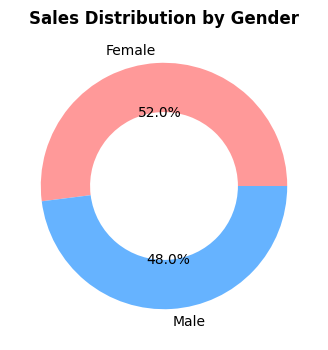

In [34]:
gender_sales = df.groupby('Gender')['Total'].sum()
plt.figure(figsize=(6,4))
gender_sales.plot(
    kind='pie',
    autopct='%1.1f%%',
    colors=['#ff9999','#66b3ff'],
    wedgeprops={'width':0.4}
)
plt.title('Sales Distribution by Gender', fontweight='bold')
plt.ylabel('')
plt.show()

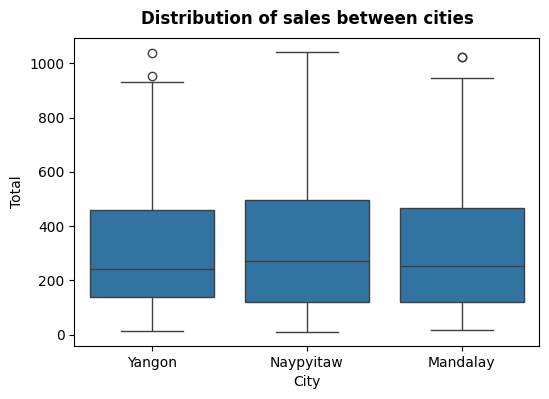

In [35]:
plt.figure(figsize=(6, 4))
sns.boxplot(x='City', y='Total', data=df)
plt.title('Distribution of sales between cities', fontsize=12, fontweight='bold', pad=10)
plt.show()

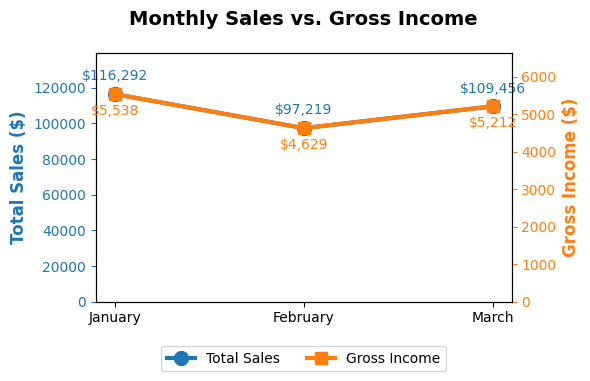

In [36]:
monthly = df.groupby(pd.to_datetime(df['Date']).dt.month_name())[['Total','gross income']].sum()
monthly = monthly.reindex(['January','February','March'])
fig, ax1 = plt.subplots(figsize=(6, 4))
plt.subplots_adjust(right=0.85)
ax1.plot(monthly.index, monthly['Total'], color='#1f77b4', marker='o', linewidth=3, markersize=10, label='Total Sales')
ax1.set_ylabel('Total Sales ($)', color='#1f77b4', fontsize=12, fontweight='bold')
ax1.tick_params(axis='y', colors='#1f77b4')
ax1.set_ylim(0, monthly['Total'].max() * 1.2)
ax2 = ax1.twinx()
ax2.plot(monthly.index, monthly['gross income'], color='#ff7f0e', marker='s', linewidth=3, markersize=8, label='Gross Income')
ax2.set_ylabel('Gross Income ($)', color='#ff7f0e', fontsize=12, fontweight='bold')
ax2.tick_params(axis='y', colors='#ff7f0e')
ax2.set_ylim(0, monthly['gross income'].max() * 1.2)
plt.title('Monthly Sales vs. Gross Income', fontsize=14, pad=20, fontweight='bold')
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
for x, y in zip(monthly.index, monthly['Total']):
    ax1.annotate(f'${y:,.0f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center', color='#1f77b4')

for x, y in zip(monthly.index, monthly['gross income']):
    ax2.annotate(f'${y:,.0f}', (x, y), textcoords="offset points", xytext=(0,-15), ha='center', color='#ff7f0e')

plt.xticks(rotation=0 if len(monthly) <= 6 else 45)
plt.tight_layout()
plt.show()

<ipython-input-37-51f4a17a88cd>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


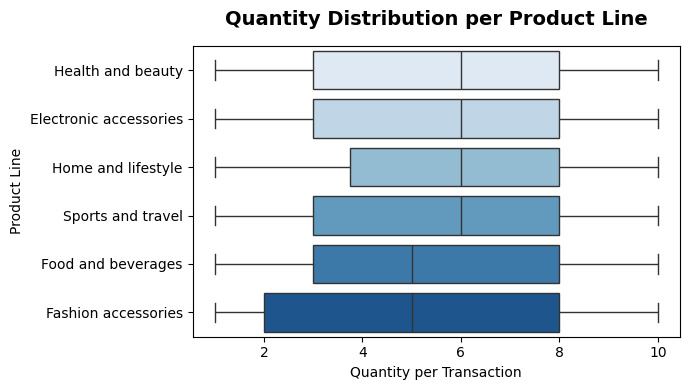

In [37]:
ordered_lines = df['Product line'].unique()
plt.figure(figsize=(7, 4))
sns.boxplot(
    y='Product line',
    x='Quantity',
    data=df,
    order=ordered_lines,
    palette='Blues'
)
plt.title('Quantity Distribution per Product Line', fontsize='14', fontweight='bold', pad=15)
plt.xlabel('Quantity per Transaction')
plt.ylabel('Product Line')
plt.tight_layout()
plt.show()


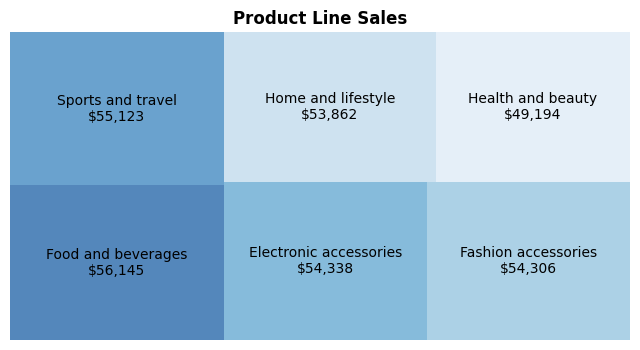

In [38]:
product_sales = df.groupby('Product line')['Total'].sum().sort_values(ascending=False)
colors = sns.color_palette('Blues', len(product_sales))
colors = colors[::-1] #colors from dark 'highest' to light 'lowest'
plt.figure(figsize=(8, 4))
squarify.plot(sizes=product_sales.values, label=[f"{k}\n${v:,.0f}" for k, v in product_sales.items()], color=colors, alpha=0.7)
plt.title('Product Line Sales', fontsize='12', fontweight='bold')
plt.axis('off')
plt.show()


<ipython-input-40-5bc920d9dd50>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Quantity', y='Product line', data=sorted_df, palette='Blues')


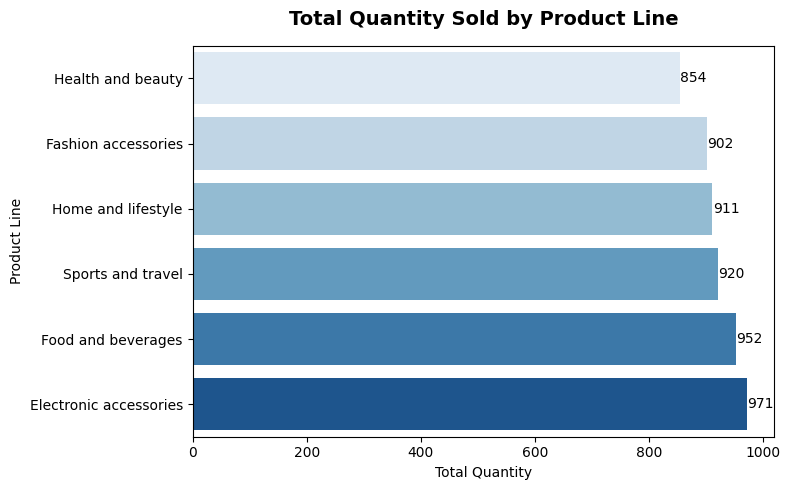

In [40]:
sorted_df = df.groupby('Product line')['Quantity'].sum().sort_values().reset_index()

# Plot
plt.figure(figsize=(8, 5))
ax = sns.barplot(x='Quantity', y='Product line', data=sorted_df, palette='Blues')

# Add values to each bar
for i, v in enumerate(sorted_df['Quantity']):
    ax.text(v + 0.5, i, str(v), color='black', va='center')

# Titles and labels
plt.title('Total Quantity Sold by Product Line', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Total Quantity')
plt.ylabel('Product Line')
plt.tight_layout()
plt.show()